# Libraries

In [1]:
import os
import cv2

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import glob
import shutil
import os
import random
from PIL import Image

import albumentations as album # for augmentation
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

%matplotlib inline

In [2]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
import segmentation_models_pytorch as smp

# Constants

## Dataset

In [3]:
IMAGE_SIZE = 256
RANDOM_STATE = 7
TRAIN_SIZE, VAL_SIZE = 0.9, 0.1

## Model

In [4]:
BATCH_SIZE = 16
EPOCHS = 20
LEARNING_RATE = 0.001
MIN_LEARNING_RATE = 0.0001

In [5]:
# Unet
ENCODER = 'mobilenet_v2'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'softmax' 

In [6]:
TRAINING = True

# Preprocess

## Loading Data

In [7]:
!pip install -q kaggle

from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"minhhung20112002","key":"fc73ffbbc1129abb162953ef121b833b"}'}

In [8]:
!mkdir ~/.kaggle

!cp kaggle.json ~/.kaggle/

! chmod 600 ~/.kaggle/kaggle.json

In [9]:
! kaggle datasets download -d balraj98/stanford-background-dataset

 88% 15.0M/17.1M [00:01<00:00, 15.4MB/s]
100% 17.1M/17.1M [00:01<00:00, 9.89MB/s]


In [10]:
!unzip /content/stanford-background-dataset.zip

Archive:  /content/stanford-background-dataset.zip
  inflating: images/0000047.jpg      
  inflating: images/0000051.jpg      
  inflating: images/0000059.jpg      
  inflating: images/0000072.jpg      
  inflating: images/0000087.jpg      
  inflating: images/0000176.jpg      
  inflating: images/0000382.jpg      
  inflating: images/0000631.jpg      
  inflating: images/0000643.jpg      
  inflating: images/0000697.jpg      
  inflating: images/0000759.jpg      
  inflating: images/0000794.jpg      
  inflating: images/0000952.jpg      
  inflating: images/0001677.jpg      
  inflating: images/0002136.jpg      
  inflating: images/0002395.jpg      
  inflating: images/0002755.jpg      
  inflating: images/0003178.jpg      
  inflating: images/0003423.jpg      
  inflating: images/0003463.jpg      
  inflating: images/0003728.jpg      
  inflating: images/0003793.jpg      
  inflating: images/0003957.jpg      
  inflating: images/0004028.jpg      
  inflating: images/0004069.jpg      

In [11]:
metadata_df = pd.read_csv( 'metadata.csv')
metadata_df = metadata_df[['image_id', 'image_path', 'label_colored_path']]
metadata_df['image_path'] = metadata_df['image_path'].apply(lambda img_pth:img_pth)
metadata_df['label_colored_path'] = metadata_df['label_colored_path'].apply(lambda img_pth:img_pth)

# Shuffle DataFrame
metadata_df = metadata_df.sample(frac=1).reset_index(drop=True)

# Perform 90/10 split for train/val/test
valid_df = metadata_df.sample(frac=0.1, random_state=7)
train_df = metadata_df.drop(valid_df.index)
len(train_df), len(valid_df)

(643, 72)

## Metadata

The dataset consists of images and their pixel-wise mask. The pixel-wise masks are labels for each pixel. 
* Class 1: sky
* Class 2: tree
* Class 3: road
* Class 4: grass
* Class 5: water
* Class 6: building
* Class 7: mountain
* Class 8: foreground
* Class 9: unknow

In [12]:
class_dict = pd.read_csv('labels_class_dict.csv')

# Get class names
class_names = class_dict['class_names'].tolist()

# Get class RGB values
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['sky', 'tree', 'road', 'grass', 'water', 'building', 'mountain', 'foreground', 'unknown']
Class RGB values:  [[68, 1, 84], [72, 40, 140], [62, 74, 137], [38, 130, 142], [31, 158, 137], [53, 183, 121], [109, 205, 89], [180, 222, 44], [49, 104, 142]]


In [13]:
# Shortlist specific classes in datasets with large number of classes
select_classes = ['sky', 'tree', 'road', 'grass', 'water', 'building', 'mountain', 'foreground', 'unknown']

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['sky', 'tree', 'road', 'grass', 'water', 'building', 'mountain', 'foreground', 'unknown']
Class RGB values:  [[68, 1, 84], [72, 40, 140], [62, 74, 137], [38, 130, 142], [31, 158, 137], [53, 183, 121], [109, 205, 89], [180, 222, 44], [49, 104, 142]]


## Functions for visualize and one-hot encoding/decoding

In [14]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [15]:
class BackgroundDataset(torch.utils.data.Dataset):

    """Stanford Background Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        df (str): DataFrame containing images / labels paths
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    def __init__(
            self, 
            df,
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.image_paths = df['image_path'].tolist()
        self.mask_paths = df['label_colored_path'].tolist()
        
        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

## Visualize Sample Image and Mask

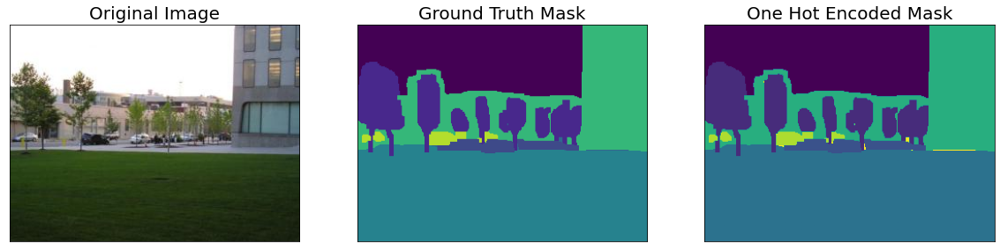

In [ ]:
dataset = BackgroundDataset(train_df, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[2]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

# Augmentation

In [16]:
def get_training_augmentation():
    train_transform = [
        album.Resize(IMAGE_SIZE, IMAGE_SIZE, p=1),
        album.HorizontalFlip(p=0.5),
        album.ShiftScaleRotate(shift_limit=0, scale_limit=0, rotate_limit=15, p=0.5),
#         album.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
        album.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
        album.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
    ]
    return album.Compose(train_transform)

def get_validation_augmentation():
    train_transform = [
        album.Resize(IMAGE_SIZE, IMAGE_SIZE, p=1),
        album.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
    ]
    return album.Compose(train_transform)

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

## Visualize Augmented Image & Mask

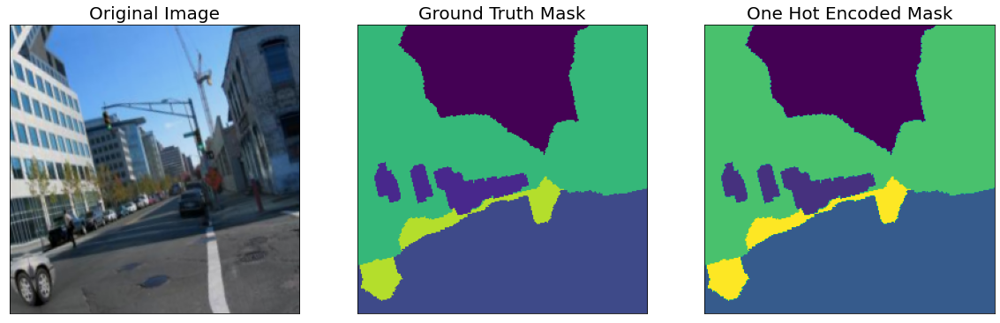

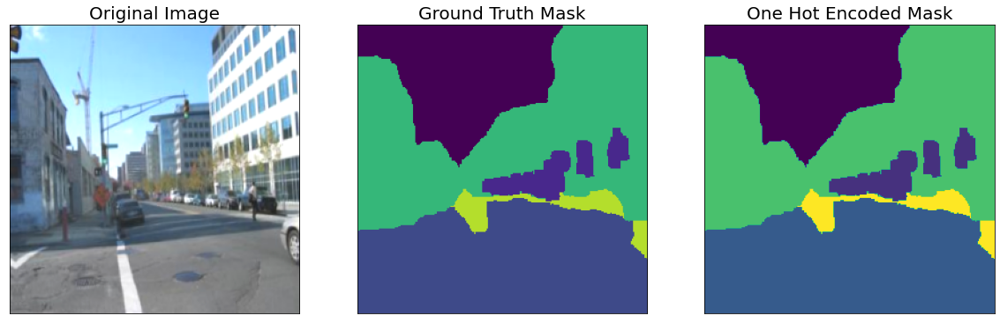

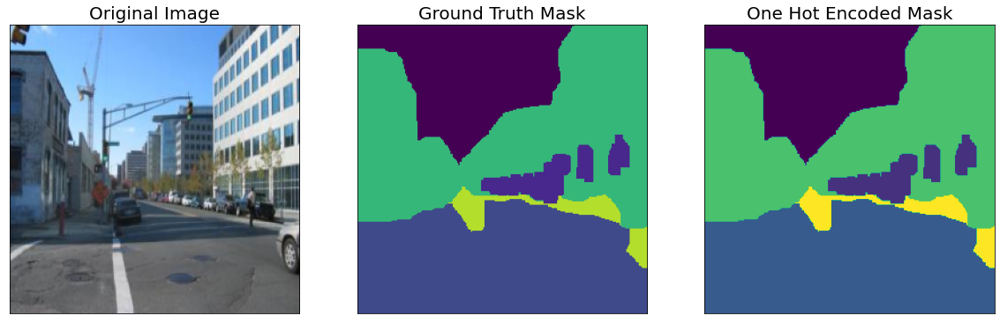

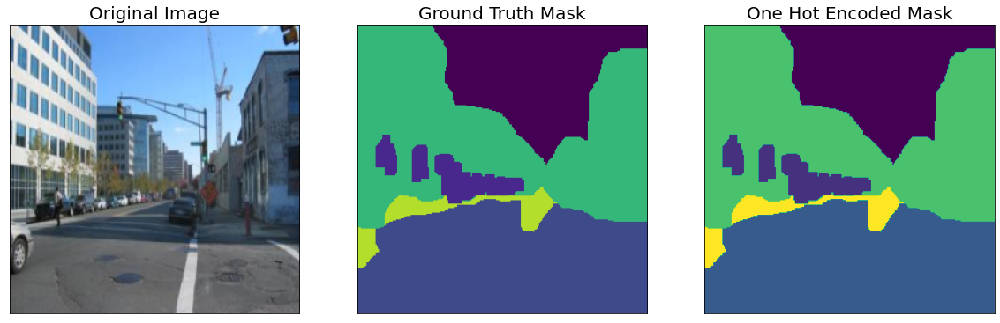

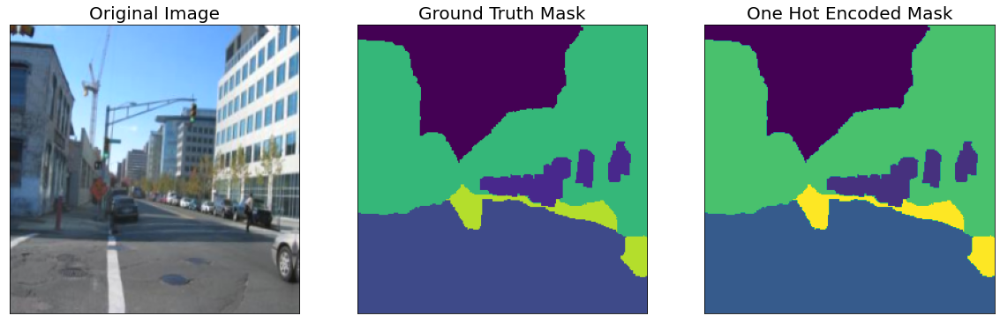

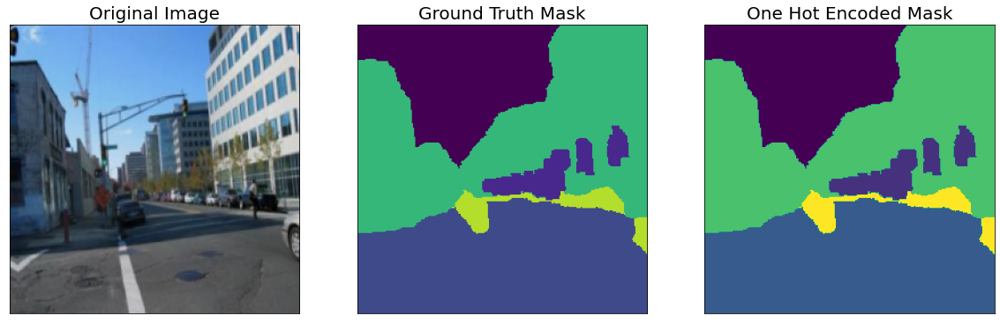

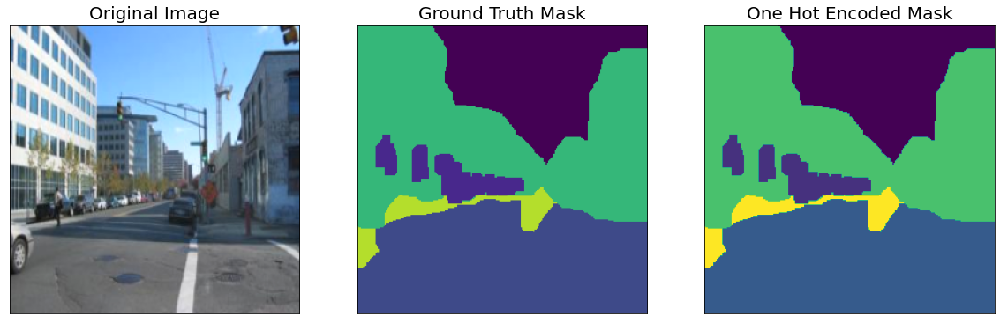

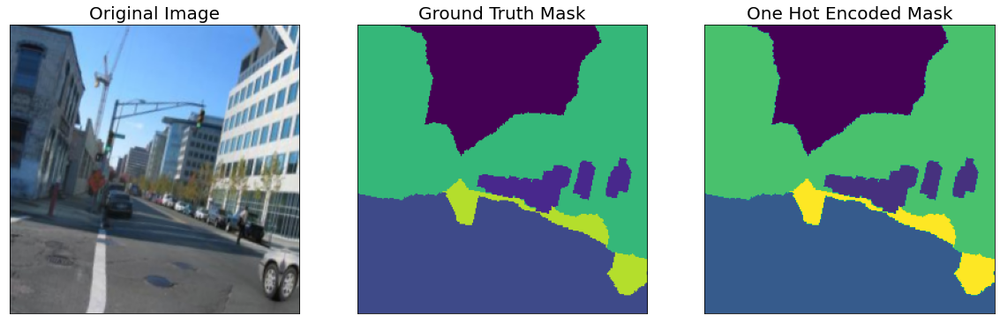

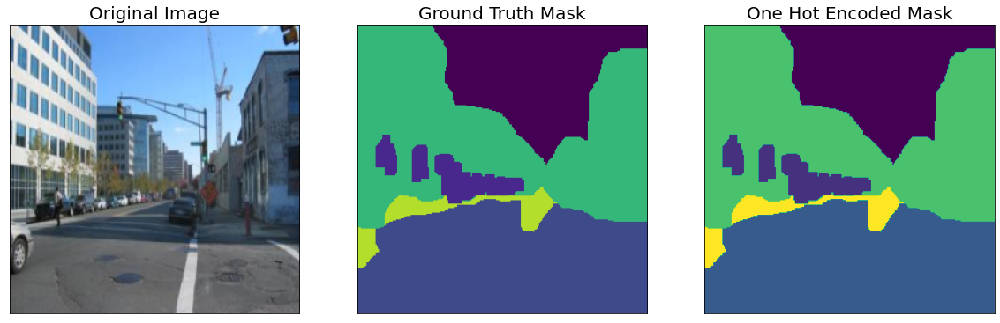

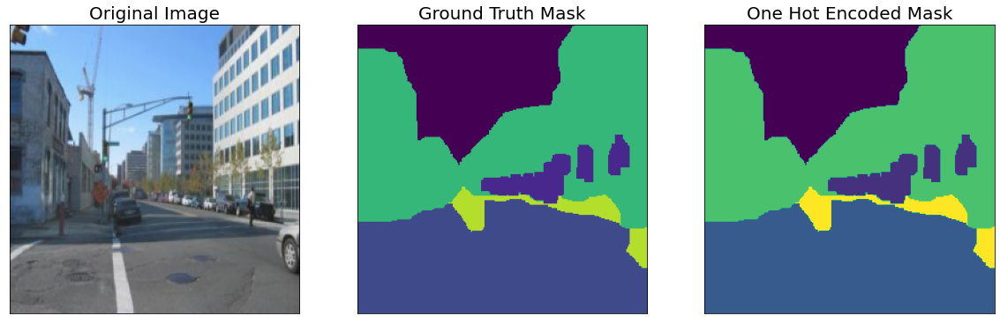

In [17]:
augmented_dataset = BackgroundDataset(
    train_df, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Different augmentations on image/mask pairs
for _ in range(10):
    image, mask = augmented_dataset[random_idx]
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )

# Training Unet

![alt text](deeplabv3+_architecture.png "DeepLabV3+ Model Architecture")

## Model Definition

In [18]:
CLASSES = select_classes
print(CLASSES)

['sky', 'tree', 'road', 'grass', 'water', 'building', 'mountain', 'foreground', 'unknown']


In [19]:
# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name='mobilenet_v2', 
    encoder_weights='imagenet', 
    classes=len(CLASSES), 
    activation='softmax',
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


  0%|          | 0.00/13.6M [00:00<?, ?B/s]

## Get Train/Val Data Loaders

In [20]:
# Get train and val dataset instances
train_dataset = BackgroundDataset(
    train_df, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = BackgroundDataset(
    valid_df, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

## Set Hyperparams

In [21]:
import segmentation_models_pytorch.utils.losses
import segmentation_models_pytorch.utils.metrics

In [22]:
# define loss function
loss = segmentation_models_pytorch.utils.losses.DiceLoss()

# define metrics
metrics = [
    segmentation_models_pytorch.utils.metrics.Accuracy(),
    segmentation_models_pytorch.utils.metrics.Recall(),
    segmentation_models_pytorch.utils.metrics.Precision(),
    segmentation_models_pytorch.utils.metrics.Fscore(),
    segmentation_models_pytorch.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

# load best saved model checkpoint from previous commit (if present)
if os.path.exists('/content/drive/MyDrive/unet_sbd.pth'):
    model = torch.load('/content/drive/MyDrive/unet_sbd.pth')
    print('Loaded pre-trained Unet model!')

In [23]:
model.eval()

Unet(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1

In [24]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    verbose=True,
)

## Define learning rate scheduler

In [25]:
class CosineAnnealingWarmRestarts:
    def __init__(self, epoch=10, min_lr=1e-4, max_lr=1e-3, T_0=1, T_mult=1):
        self.epoch = epoch
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.T_0 = T_0
        self.T_mult = T_mult

    def calc_lr(self, ep):
        if ep < self.T_0:
            return self.max_lr
        ep = ep - (self.T_0-1)

        if self.T_mult == 1:
            T_cur = ep-1
            T_i = self.epoch - self.T_0
            return self.min_lr + 1/2 * (self.max_lr - self.min_lr) * (1 + np.cos(T_cur/T_i*np.pi))

        def calc_restart_count(e, cnt):
            if e * self.T_mult > ep:
                return cnt
            return calc_restart_count(e * self.T_mult, cnt+1)

        restart_count = calc_restart_count(1, 0)
        T_cur = ep - self.T_mult ** restart_count
        T_i = max(self.T_mult ** restart_count - 1, 1)
    #     print(epoch, restart_count, T_cur, T_i)

        return self.min_lr + 1/2 * (self.max_lr - self.min_lr) * (1 + np.cos(T_cur/T_i*np.pi))

Text(0.5, 1.0, 'T_mult: 2')

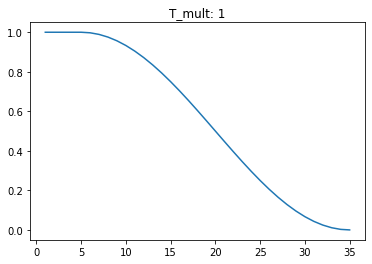

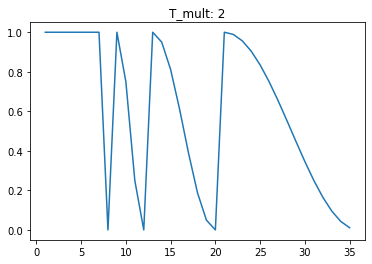

In [26]:
ca = CosineAnnealingWarmRestarts(epoch=35, min_lr=0, max_lr=1, T_0=5, T_mult=1)
a = [ca.calc_lr(i) for i in range(1, 36)]
plt.plot(range(1, len(a)+1), a)
plt.title("T_mult: 1")

ca = CosineAnnealingWarmRestarts(epoch=35, min_lr=0, max_lr=1, T_0=6, T_mult=2)
a = [ca.calc_lr(i) for i in range(1, 36)]
plt.figure()
plt.plot(range(1, len(a)+1), a)
plt.title("T_mult: 2")

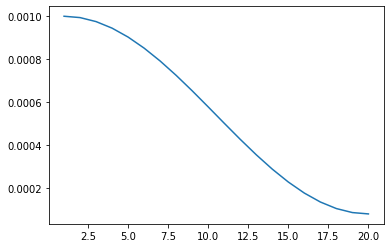

In [27]:
ca_lr_scheduler = CosineAnnealingWarmRestarts(epoch=EPOCHS, min_lr=0.00008, max_lr=LEARNING_RATE, T_0=1, T_mult=1)

a = [ca_lr_scheduler.calc_lr(i) for i in range(1, EPOCHS+1)]
plt.figure()
plt.plot(range(1, len(a)+1), a)

## Training Unet

In [28]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(1, EPOCHS+1):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))

        lr = ca_lr_scheduler.calc_lr(i)
        print('Learning rate: {}'.format(lr))

        optimizer = torch.optim.Adam([ 
            dict(params=model.parameters(), lr=lr),
        ])

        train_epoch = smp.utils.train.TrainEpoch(
            model, 
            loss=loss, 
            metrics=metrics, 
            optimizer=optimizer,
            verbose=True,
        )

        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, './Unet_sbd.pth')
            print('Model saved!')


Epoch: 1
Learning rate: 0.001
train:   0%|          | 0/41 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/segmentation_models_pytorch/base/modules.py:116: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self.activation(x)


valid: 100%|██████████| 5/5 [00:12<00:00,  2.48s/it, dice_loss - 0.413, accuracy - 0.925, recall - 0.6004, precision - 0.6847, fscore - 0.6395, iou_score - 0.4723]
Model saved!

Epoch: 2
Learning rate: 0.0009937261995652522
valid: 100%|██████████| 5/5 [00:12<00:00,  2.47s/it, dice_loss - 0.3862, accuracy - 0.9254, recall - 0.6044, precision - 0.6846, fscore - 0.6416, iou_score - 0.475]
Model saved!

Epoch: 3
Learning rate: 0.0009750759311822919
valid: 100%|██████████| 5/5 [00:12<00:00,  2.51s/it, dice_loss - 0.2901, accuracy - 0.9388, recall - 0.7214, precision - 0.7264, fscore - 0.7239, iou_score - 0.5683]
Model saved!

Epoch: 4
Learning rate: 0.0009445579255549849
valid: 100%|██████████| 5/5 [00:13<00:00,  2.63s/it, dice_loss - 0.2416, accuracy - 0.9466, recall - 0.7591, precision - 0.7601, fscore - 0.7596, iou_score - 0.6154]
Model saved!

Epoch: 5
Learning rate: 0.0009030046343223411
valid: 100%|██████████| 5/5 [00:12<00:00,  2.52s/it, dice_loss - 0.2543, accuracy - 0.9437, recall 

# Prediction on Test Data

In [41]:
from google.colab import files

files.download('./Unet_sbd.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [30]:
# load best saved model checkpoint from the current run
if os.path.exists('./Unet_sbd.pth'):
    model = torch.load('./Unet_sbd.pth')
    print('Loaded Unet model from this run.')

Loaded Unet model from this run.


In [31]:
model.eval()

Unet(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1

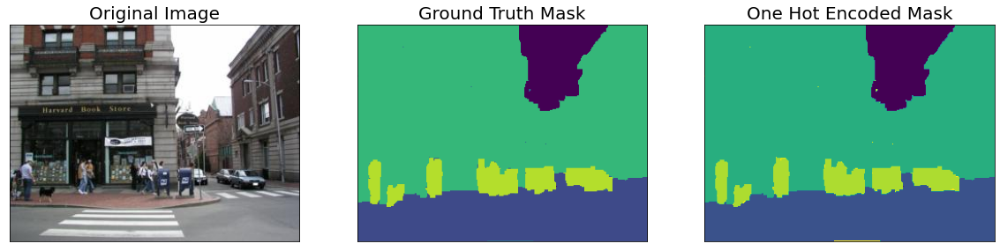

In [32]:
# create test dataloader (with preprocessing operation: to_tensor(...))
test_dataset = BackgroundDataset(
    valid_df, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing augmentations & transformations)
test_dataset_vis = BackgroundDataset(
    valid_df,
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [33]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

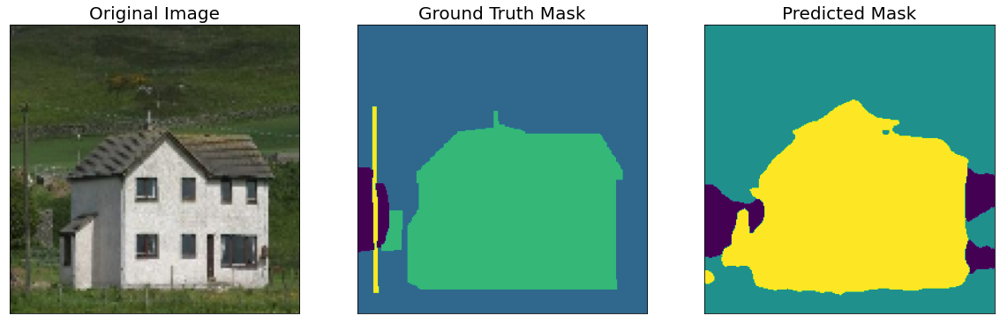

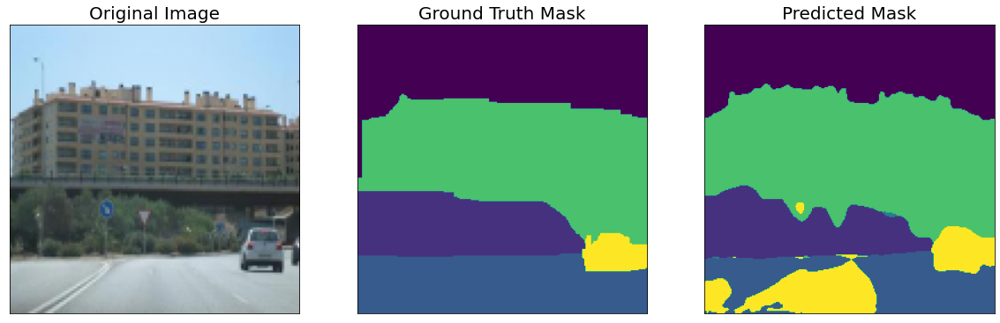

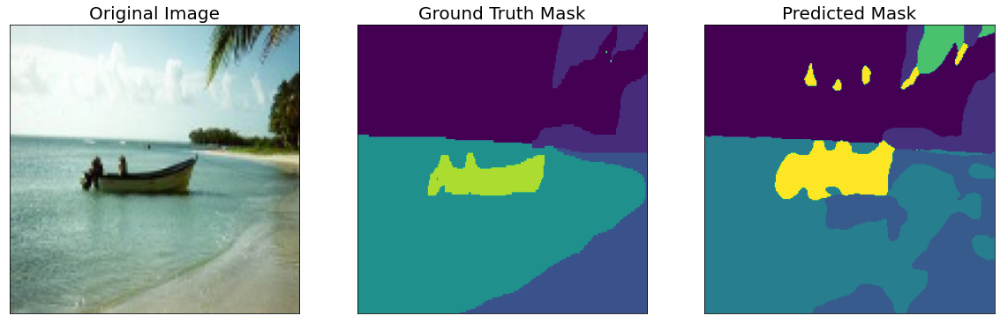

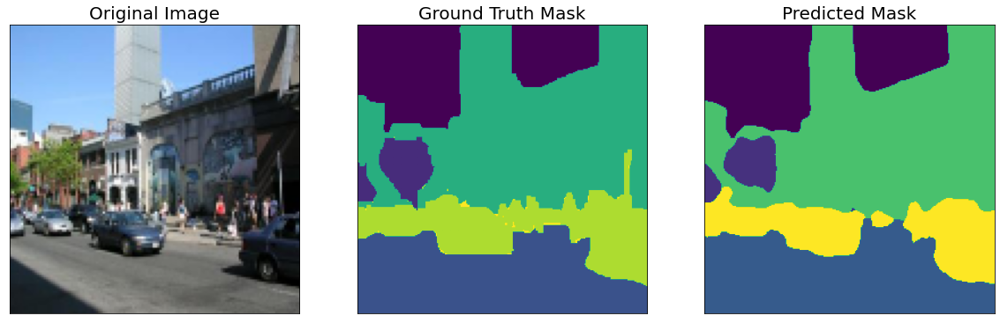

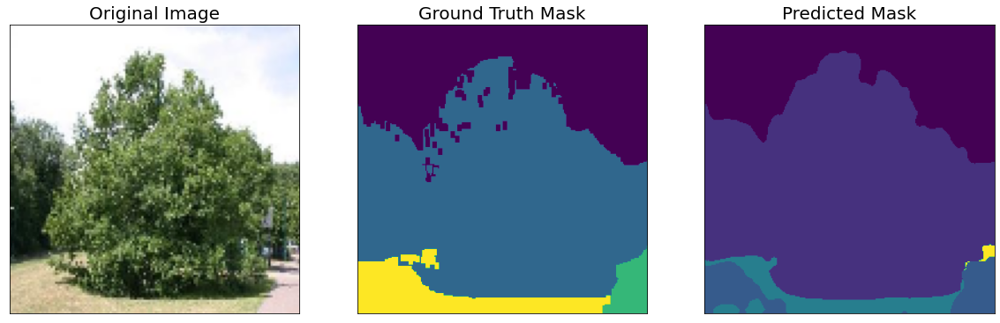

...

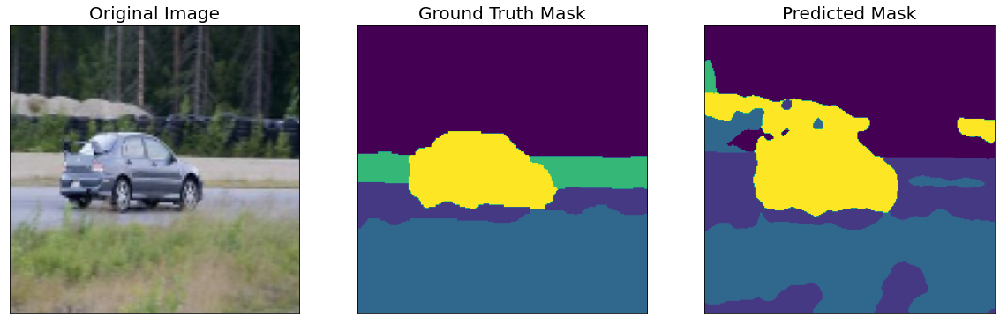

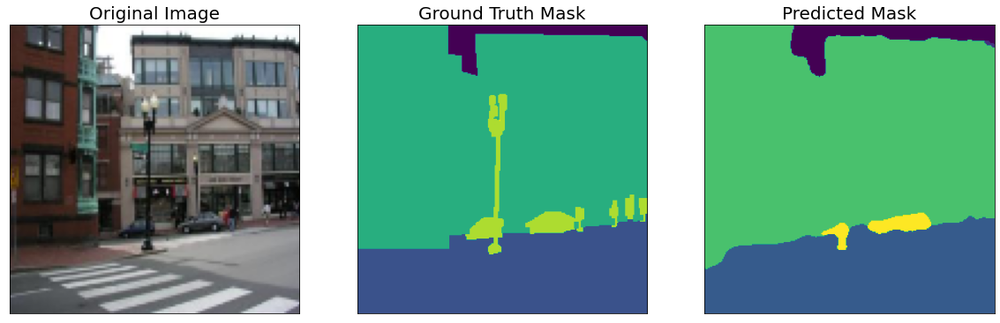

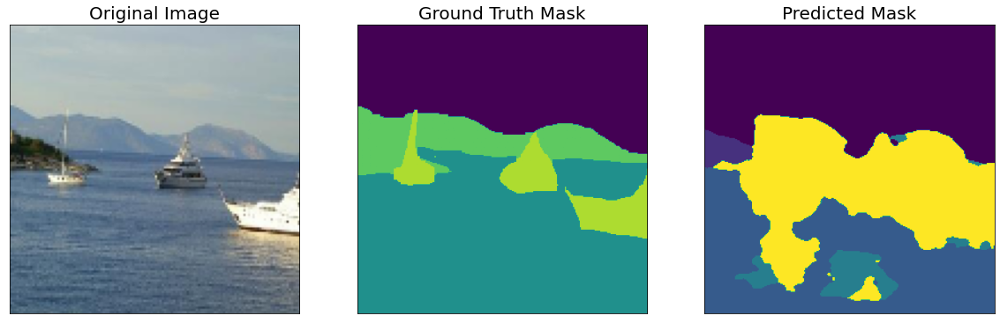

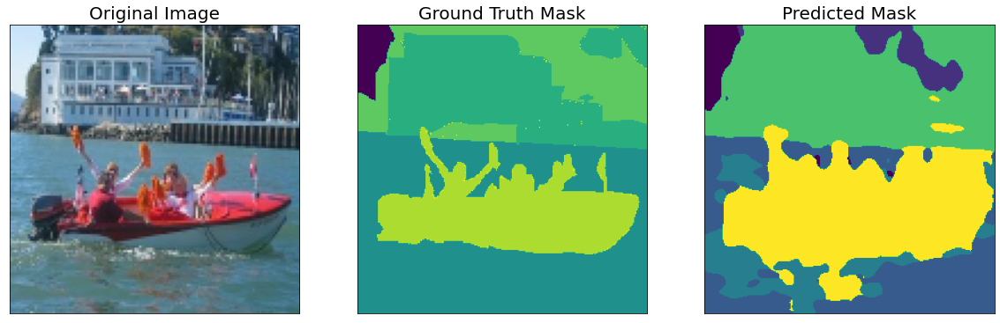

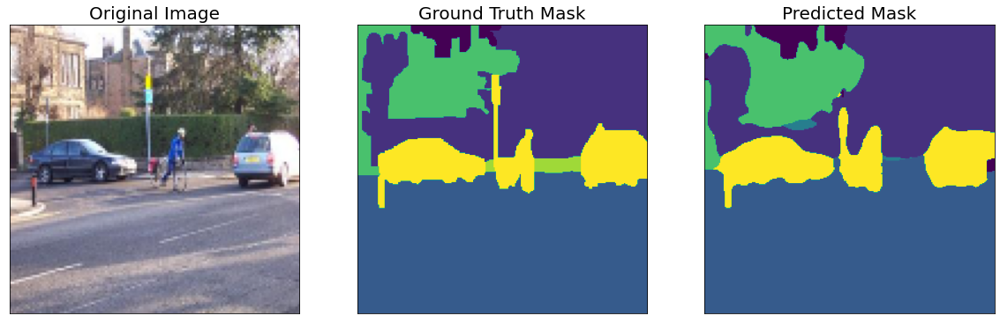

In [34]:
n = 30
idxes = np.random.randint(0,len(test_dataset),n)
for idx in idxes:
    image, gt_mask = test_dataset[idx]
    image_vis, _ = test_dataset_vis[idx]
    x_tensor = torch.from_numpy(image).unsqueeze(0)

    # Predict test image
    pred_mask = model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()

    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    gt_mask = np.transpose(gt_mask,(1,2,0))
    
    visualize(
        original_image = cv2.resize(image_vis, dsize=(128, 128)),
        ground_truth_mask = reverse_one_hot(gt_mask),
        predicted_mask = reverse_one_hot(pred_mask),
    )

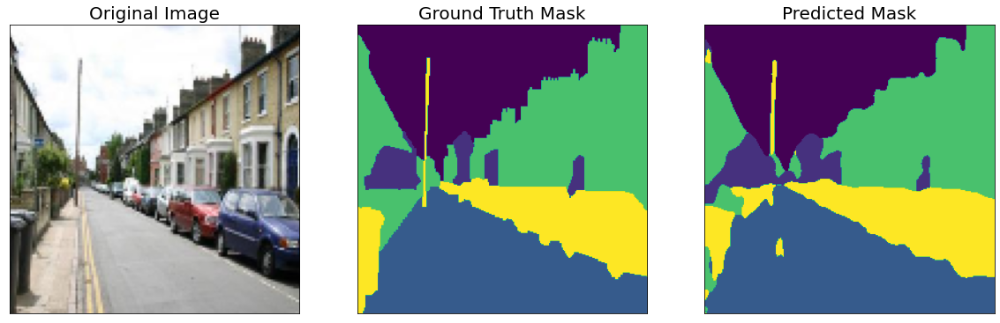

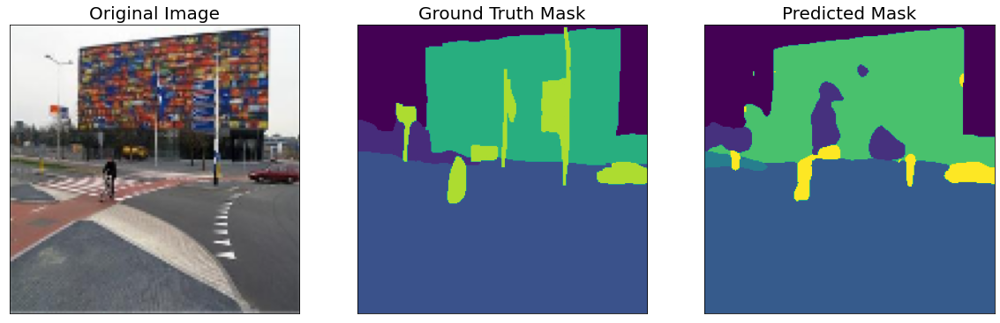

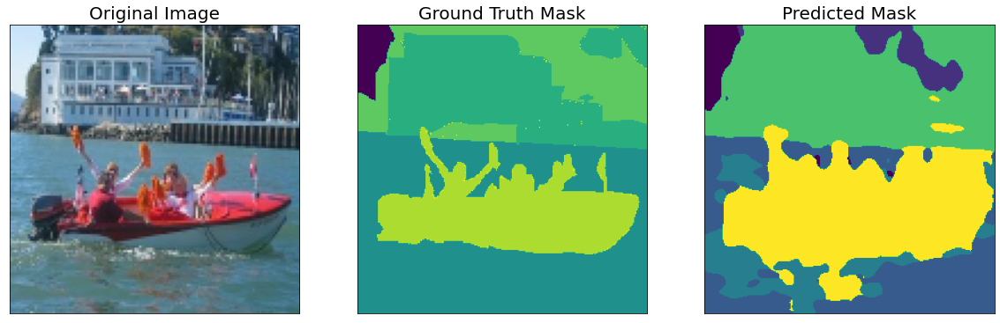

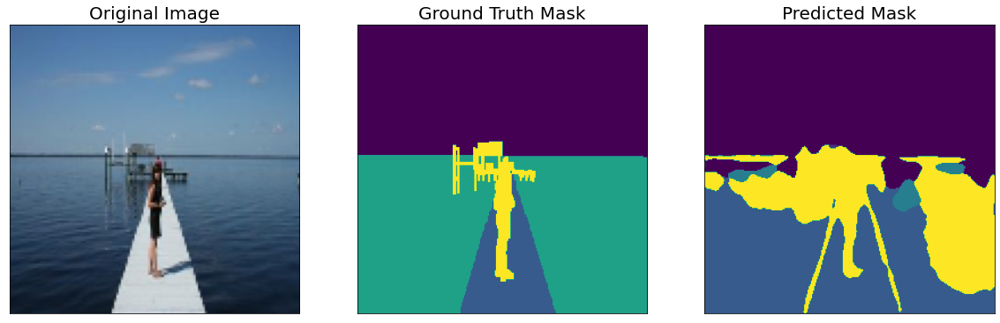

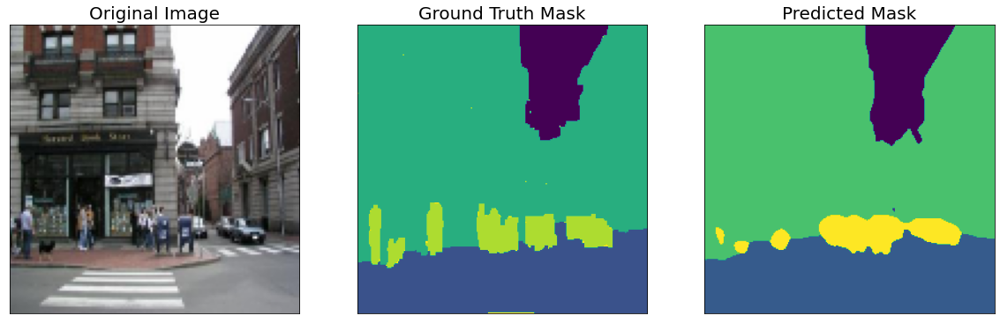

...

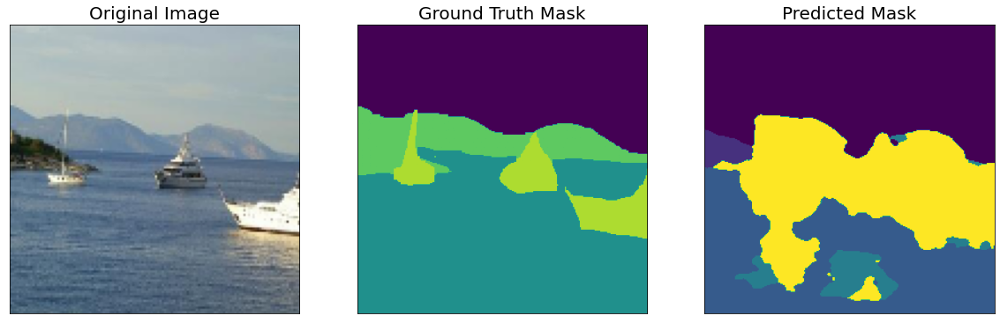

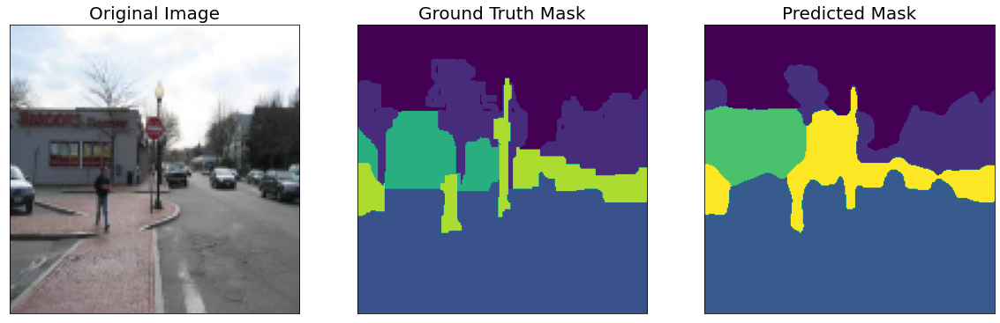

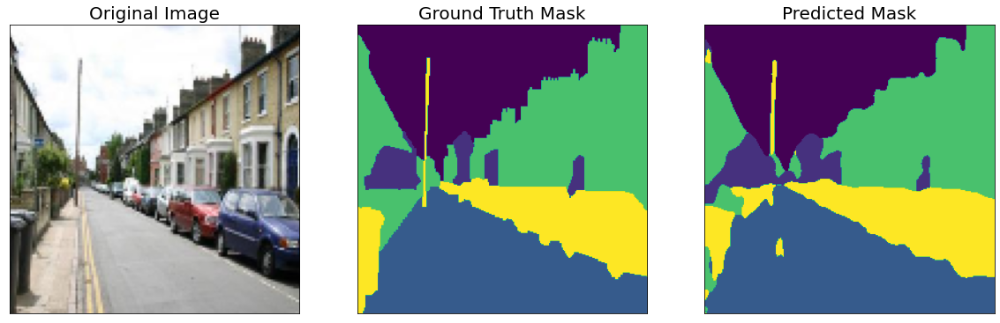

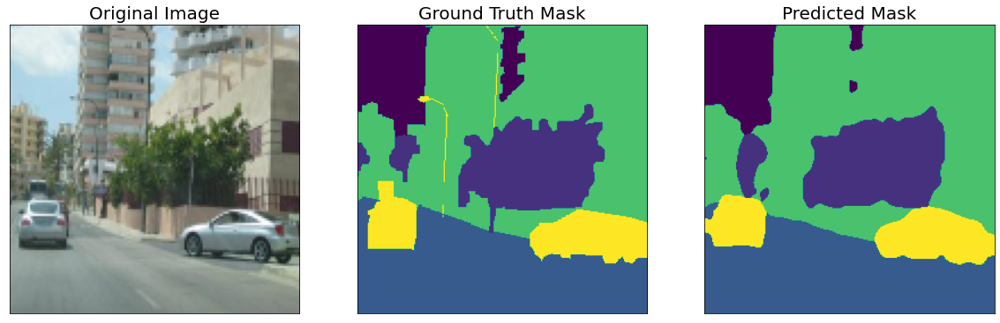

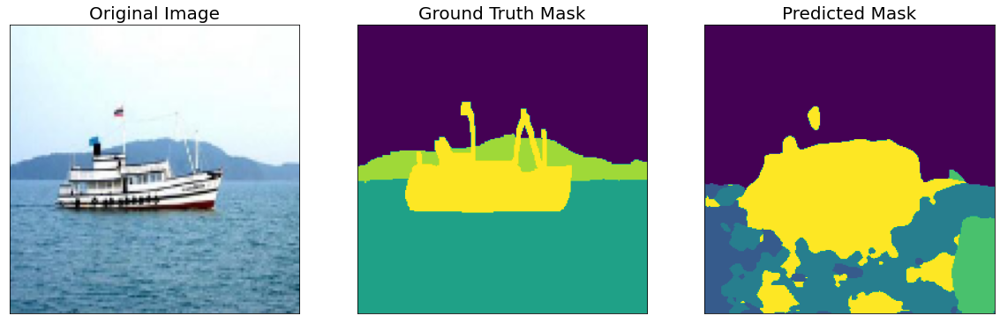

In [35]:
n = 30
idxes = np.random.randint(0,len(test_dataset),n)
for idx in idxes:
    image, gt_mask = test_dataset[idx]
    image_vis, _ = test_dataset_vis[idx]
    x_tensor = torch.from_numpy(image).unsqueeze(0)

    # Predict test image
    pred_mask = model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()

    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    gt_mask = np.transpose(gt_mask,(1,2,0))
    
    visualize(
        original_image = cv2.resize(image_vis, dsize=(128, 128)),
        ground_truth_mask = reverse_one_hot(gt_mask),
        predicted_mask = reverse_one_hot(pred_mask),
    )

# Model Evaluation on Test Dataset

In [36]:
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Accuracy: {valid_logs['accuracy']:.4f}")
print(f"Recall: {valid_logs['recall']:.4f}")
print(f"Precision: {valid_logs['precision']:.4f}")
print(f"F1-Score: {valid_logs['fscore']:.4f}")
print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

valid: 100%|██████████| 72/72 [00:13<00:00,  5.41it/s, dice_loss - 0.2029, accuracy - 0.955, recall - 0.7973, precision - 0.7977, fscore - 0.7975, iou_score - 0.699]
Evaluation on Test Data: 
Accuracy: 0.9550
Recall: 0.7973
Precision: 0.7977
F1-Score: 0.7975
Mean IoU Score: 0.6990
Mean Dice Loss: 0.2029


## Plot Dice Loss & IoU Metric for Train vs. Val

In [37]:
train_logs_df = pd.DataFrame(train_logs_list)
train_logs_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
dice_loss,0.470749,0.291071,0.262082,0.222707,0.212263,0.199435,0.190107,0.197805,0.187426,0.178656,0.175018,0.168943,0.164720,0.165166,0.162267,0.154333,0.158776,0.156230,0.150589,0.149949
accuracy,0.928970,0.941019,0.944865,0.951111,0.953098,0.955874,0.957906,0.956187,0.958481,0.960425,0.961230,0.962561,0.963498,0.963392,0.964041,0.965798,0.964805,0.965383,0.966630,0.966774
recall,0.521042,0.716605,0.737623,0.778926,0.788301,0.800970,0.810213,0.802480,0.812832,0.821581,0.825244,0.831275,0.835498,0.835038,0.837948,0.845878,0.841389,0.843983,0.849620,0.850264
precision,0.743363,0.743190,0.759044,0.780596,0.789309,0.801713,0.810803,0.803058,0.813372,0.822127,0.825725,0.831688,0.835902,0.835417,0.838346,0.846237,0.841780,0.844384,0.849984,0.850634
fscore,0.592554,0.729616,0.748104,0.779760,0.788804,0.801341,0.810508,0.802769,0.813102,0.821854,0.825484,0.831481,0.835700,0.835227,0.838146,0.846057,0.841584,0.844183,0.849802,0.850449
iou_score,0.442228,0.576474,0.599294,0.640649,0.653502,0.670537,0.683013,0.672315,0.686380,0.698963,0.704138,0.713572,0.718968,0.718953,0.723171,0.734386,0.728500,0.732286,0.740399,0.741348


In [38]:
valid_logs_df = pd.DataFrame(valid_logs_list)
valid_logs_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
dice_loss,0.413033,0.386213,0.290119,0.241614,0.254298,0.233144,0.232527,0.236292,0.227652,0.217099,0.215758,0.215951,0.221437,0.218939,0.213999,0.213262,0.208959,0.213941,0.208958,0.211943
accuracy,0.924976,0.925358,0.938845,0.946607,0.943705,0.948350,0.948461,0.947636,0.949567,0.951891,0.952190,0.952138,0.950902,0.951465,0.952543,0.952736,0.953675,0.952578,0.953680,0.953003
recall,0.600449,0.604366,0.721379,0.759088,0.746160,0.767233,0.767712,0.764014,0.772594,0.783141,0.784503,0.784289,0.778750,0.781278,0.786140,0.786929,0.791245,0.786231,0.791204,0.788218
precision,0.684700,0.684584,0.726389,0.760065,0.746927,0.767762,0.768260,0.764540,0.773293,0.783704,0.785043,0.784796,0.779218,0.781757,0.786607,0.787509,0.791700,0.786796,0.791752,0.788674
fscore,0.639499,0.641600,0.723874,0.759576,0.746543,0.767498,0.767986,0.764277,0.772944,0.783422,0.784773,0.784542,0.778984,0.781517,0.786374,0.787219,0.791473,0.786513,0.791478,0.788446
iou_score,0.472336,0.475013,0.568342,0.615422,0.597928,0.625825,0.626520,0.621681,0.633299,0.647079,0.649081,0.648517,0.641511,0.644765,0.651268,0.652726,0.658000,0.651566,0.658466,0.654273


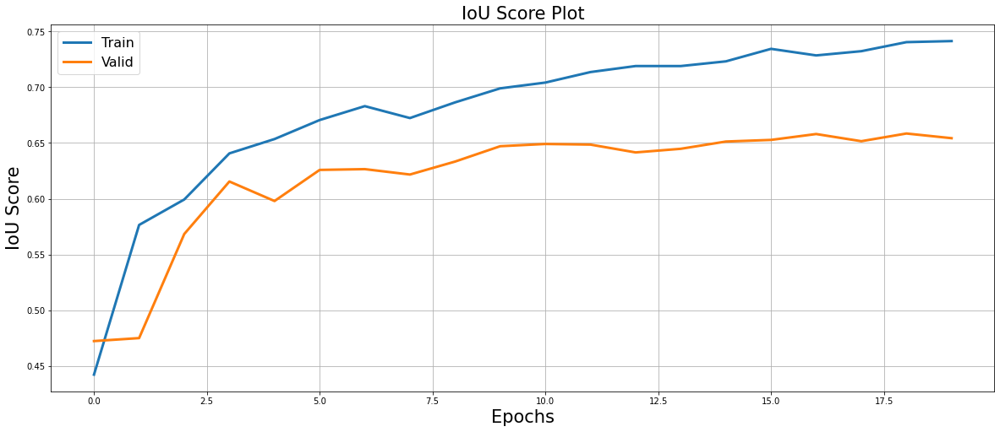

In [39]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.iou_score.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.iou_score.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('IoU Score', fontsize=21)
plt.title('IoU Score Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

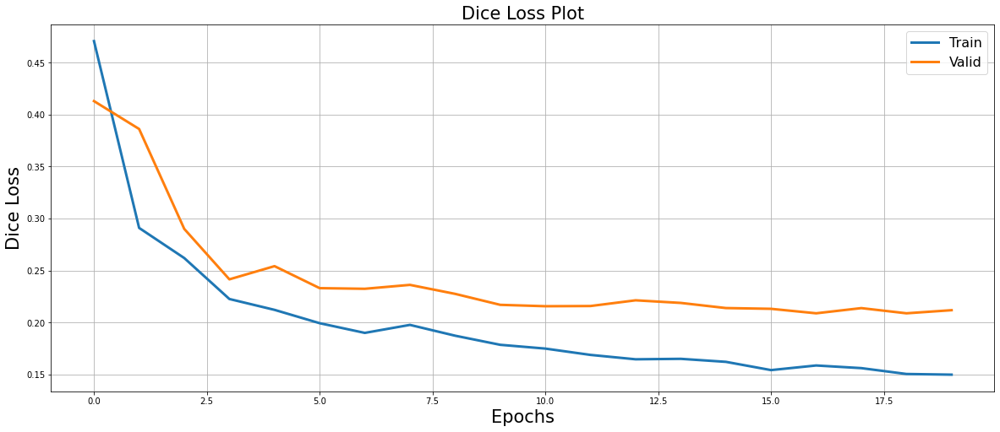

In [40]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.dice_loss.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.dice_loss.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('Dice Loss', fontsize=21)
plt.title('Dice Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('dice_loss_plot.png')
plt.show()